# Predict house pricing using advanced regression

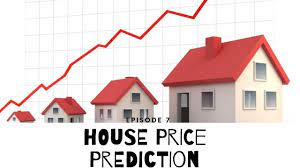

## GOAL

## Import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from termcolor import colored

import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_columns",None)
pd.set_option("display.width",600)
pd.set_option("display.max_rows",100)
pd.set_option('display.float_format', lambda x: '%.3f' % x) 

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

from pycaret.regression import*

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor

## Load and EDA

In [28]:
df1 = pd.read_csv("train.csv")
df1



,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.000,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.000,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0.000,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.000,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.000,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.000,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.000,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.000,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NaN,0.000,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.000,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.000,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,NaN,0.000,T

In [30]:
df2 = pd.read_csv("test.csv")
df2

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.000,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.000,TA,TA,CBlock,TA,TA,No,Rec,468.000,LwQ,144.000,270.000,882.000,GasA,TA,Y,SBrkr,896,0,0,896,0.000,0.000,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.000,Unf,1.000,730.000,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.000,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.000,TA,TA,CBlock,TA,TA,No,ALQ,923.000,Unf,0.000,406.000,1329.000,GasA,TA,Y,SBrkr,1329,0,0,1329,0.000,0.000,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.000,Unf,1.000,312.000,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.000,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.000,TA,TA,PConc,Gd,TA,No,GLQ,791.000,Unf,0.000,137.000,928.000,GasA,Gd,Y,SBrkr,928,701,0,1629,0.000,0.000,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.000,Fin,2.000,482.000,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.000,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.000,TA,TA,PConc,TA,TA,No,GLQ,602.000,Unf,0.000,324.000,926.000,GasA,Ex,Y,SBrkr,926,678,0,1604,0.000,0.000,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.000,Fin,2.000,470.000,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.000,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.000,Gd,TA,PConc,Gd,TA,No,ALQ,263.000,Unf,0.000,1017.000,1280.000,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.000,0.000,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.000,RFn,2.000,506.000,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,RM,21.000,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,2Story,4,7,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.000,TA,TA,CBlock,TA,TA,No,Unf,0.000,Unf,0.000,546.000,546.000,GasA,Gd,Y,SBrkr,546,546,0,1092,0.000,0.000,1,1,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal
1455,2916,160,RM,21.000,1894,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,4,5,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.000,TA,TA,CBlock,TA,TA,No,Rec,252.000,Unf,0.000,294.000,546.000,GasA,TA,Y,SBrkr,546,546,0,1092,0.000,0.000,1,1,3,1,TA,6,Typ,0,NaN,CarPort,1970.000,Unf,1.000,286.000,TA,TA,Y,0,24,0,0,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml
1456,2917,20,RL,160.000,20000,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,7,1960,1996,Gable,CompShg,VinylSd,VinylSd,NaN,0.000,TA,TA,CBlock,TA,TA,No,ALQ,1224.000,Unf,0.000,0.000,1224.000,GasA,Ex,Y,SBrkr,1224,0,0,1224,1.000,0.000,1,0,4,1,TA,7,Typ,1,TA,Detchd,1960.000,Unf,2.000,576.000,TA

In [32]:
df = pd.concat([df1,df2], ignore_index=True)
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,Y,SBrkr,856,854,0,1710,1.000,0.000,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.000
1,2,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.000,1.000,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.000
2,3,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,Y,SBrkr,920,866,0,1786,1.000,0.000,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.000
3,4,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,Y,SBrkr,961,756,0,1717,1.000,0.000,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.000
4,5,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.000,0.000,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.000


In [207]:
df_copy = df.copy()

In [146]:
df.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
2914,2915,160,RM,21.000,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,2Story,4,7,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.000,TA,TA,CBlock,TA,TA,No,Unf,0.000,Unf,0.000,546.000,546.000,GasA,Gd,Y,SBrkr,546,546,0,1092,0.000,0.000,1,1,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal,NaN
2915,2916,160,RM,21.000,1894,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,4,5,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.000,TA,TA,CBlock,TA,TA,No,Rec,252.000,Unf,0.000,294.000,546.000,GasA,TA,Y,SBrkr,546,546,0,1092,0.000,0.000,1,1,3,1,TA,6,Typ,0,NaN,CarPort,1970.000,Unf,1.000,286.000,TA,TA,Y,0,24,0,0,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml,NaN
2916,2917,20,RL,160.000,20000,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,7,1960,1996,Gable,CompShg,VinylSd,VinylSd,NaN,0.000,TA,TA,CBlock,TA,TA,No,ALQ,1224.000,Unf,0.000,0.000,1224.000,GasA,Ex,Y,SBrkr,1224,0,0,1224,1.000,0.000,1,0,4,1,TA,7,Typ,1,TA,Detchd,1960.000,Unf,2.000,576.000,TA,TA,Y,474,0,0,0,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml,NaN
2917,2918,85,RL,62.000,10441,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,SFoyer,5,5,1992,1992,Gable,CompShg,HdBoard,Wd Shng,NaN,0.000,TA,TA,PConc,Gd,TA,Av,GLQ,337.000,Unf,0.000,575.000,912.000,GasA,TA,Y,SBrkr,970,0,0,970,0.000,1.000,1,0,3,1,TA,6,Typ,0,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,Y,80,32,0,0,0,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal,NaN
2918,2919,60,RL,74.000,9627,Pave,NaN,Reg,Lvl,AllPub,Inside,Mod,Mitchel,Norm,Norm,1Fam,2Story,7,5,1993,1994,Gable,CompShg,HdBoard,HdBoard,BrkFace,94.000,TA,TA,PConc,Gd,TA,Av,LwQ,758.000,Unf,0.000,238.000,996.000,GasA,Ex,Y,SBrkr,996,1004,0,2000,0.000,0.000,2,1,3,1,TA,9,Typ,1,TA,Attchd,1993.000,Fin,3.000,650.000,TA,TA,Y,190,48,0,0,0,0,NaN,NaN,NaN,0,11,2006,WD,Normal,NaN


In [12]:
def check_df(df, head=5, tail=5):
    print(" SHAPE ".center(70, '*'))
    print(f'Observations -------> {df.shape[0]}')
    print(f'Features     -------> {df.shape[1]}')
    print(f"Shape of dataset: {colored(df.shape, 'red')}")
    print(" TYPES OF FEATURES ".center(70, '*'))
    print(df.dtypes,"\n")
    print(" INFO ".center(70, "*"))
    print("\n",df.info(),"\n")
    print(' DUPLICATE VALUE ANALYSIS '.center(70, '*'))
    print("\n",df.duplicated().sum(),"\n")
    print(" MISSING VALUES ".center(70, "*"))
    print(df.isnull().sum())
    print(" DESCRIPTIVE STATISTICS ".center(70, "*"))
    print(df.describe().T)
check_df(df)

******************************* SHAPE ********************************
Observations -------> 2919
Features     -------> 81
Shape of dataset: (2919, 81)
************************* TYPES OF FEATURES **************************
Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
Bs

In [13]:
## Thus we found number of unique values of all columns with this function 
def check_unique(df):

  dict = {}
  for i in list(df.columns):
    dict[i] = df[i].nunique()
  nunq = pd.DataFrame(dict,index=["Number of Unique"]).transpose().sort_values(by="Number of Unique",ascending=False)
  return nunq
check_unique(df)  



,Number of Unique
Id,2919
LotArea,1951
GrLivArea,1292
BsmtUnfSF,1135
1stFlrSF,1083
TotalBsmtSF,1058
BsmtFinSF1,991
SalePrice,663
2ndFlrSF,635
GarageArea,603


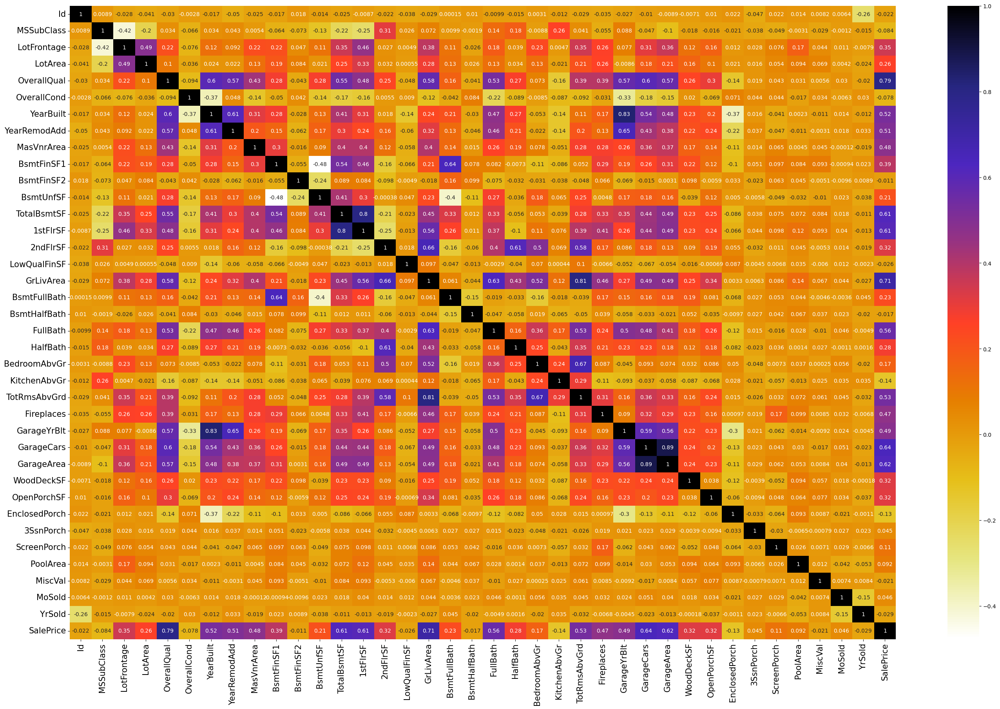

In [20]:
plt.figure(figsize=(34,21))
plt.xticks(rotation=45,size=15)
plt.yticks(size=15)
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap=plt.cm.CMRmap_r);

In [21]:
abs(df.corr(numeric_only=True)["SalePrice"]).sort_values(ascending=False)

SalePrice       1.000
OverallQual     0.791
GrLivArea       0.709
GarageCars      0.640
GarageArea      0.623
TotalBsmtSF     0.614
1stFlrSF        0.606
FullBath        0.561
TotRmsAbvGrd    0.534
YearBuilt       0.523
YearRemodAdd    0.507
GarageYrBlt     0.486
MasVnrArea      0.477
Fireplaces      0.467
BsmtFinSF1      0.386
LotFrontage     0.352
WoodDeckSF      0.324
2ndFlrSF        0.319
OpenPorchSF     0.316
HalfBath        0.284
LotArea         0.264
BsmtFullBath    0.227
BsmtUnfSF       0.214
BedroomAbvGr    0.168
KitchenAbvGr    0.136
EnclosedPorch   0.129
ScreenPorch     0.111
PoolArea        0.092
MSSubClass      0.084
OverallCond     0.078
MoSold          0.046
3SsnPorch       0.045
YrSold          0.029
LowQualFinSF    0.026
Id              0.022
MiscVal         0.021
BsmtHalfBath    0.017
BsmtFinSF2      0.011
Name: SalePrice, dtype: float64

## Auto ML

In [23]:
setup(data=df1, target="SalePrice")

,Description,Value
0,Session id,5142
1,Target,SalePrice
2,Target type,Regression
3,Original data shape,"(1460, 81)"
4,Transformed data shape,"(1460, 281)"
5,Transformed train set shape,"(1021, 281)"
6,Transformed test set shape,"(439, 281)"
7,Numeric features,37
8,Categorical features,43
9,Rows with missing values,100.0%


In [24]:
best_model = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,16415.3681,751808443.0924,26670.8749,0.8743,0.1304,0.0937,0.1860
et,Extra Trees Regressor,17649.4915,889386800.1396,29067.4446,0.8524,0.1409,0.1018,0.3920
xgboost,Extreme Gradient Boosting,17651.6933,923595411.8268,29551.3206,0.8500,0.1367,0.0999,0.1800
rf,Random Forest Regressor,17566.9929,919953647.8192,29170.4027,0.8483,0.1416,0.1023,0.4000
lightgbm,Light Gradient Boosting Machine,16893.4543,954906116.7162,29998.0785,0.8427,0.1335,0.0941,0.2020
ada,AdaBoost Regressor,24171.3887,1383521525.4387,36157.3036,0.7758,0.1919,0.1537,0.1590
ridge,Ridge Regression,19642.2370,1360788302.9232,34790.9849,0.7552,0.2069,0.1168,0.0950
lasso,Lasso Regression,19307.4818,1459026340.5139,35357.9257,0.7348,0.1782,0.1173,0.4130
llar,Lasso Least Angle Regression,19649.0526,1509836474.9895,35838.1490,0.7337,0.1708,0.1148,0.1050
en,Elastic Net,20433.8516,1644749558.2684,37823.1170,0.7142,0.1690,0.1160,0.1440


In [25]:
best_model = create_model("gbr")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,14529.2628,401123091.1804,20028.0576,0.9214,0.1083,0.0839
1,16397.2440,1009377429.0229,31770.7008,0.8781,0.1628,0.1103
2,14755.2200,549697134.5522,23445.6208,0.9059,0.1221,0.0851
3,18386.4527,746050819.5199,27313.9309,0.8661,0.1335,0.1044
4,18425.9446,1393100738.2082,37324.2647,0.7839,0.1534,0.0998
5,17036.7108,1161781072.4500,34084.9097,0.7476,0.1739,0.1117
6,14270.8394,379533214.0294,19481.6122,0.9074,0.1064,0.0826
7,12965.1269,280794557.8884,16756.9257,0.9503,0.0913,0.0737
8,18763.5835,774767487.3672,27834.6455,0.8649,0.1199,0.0898


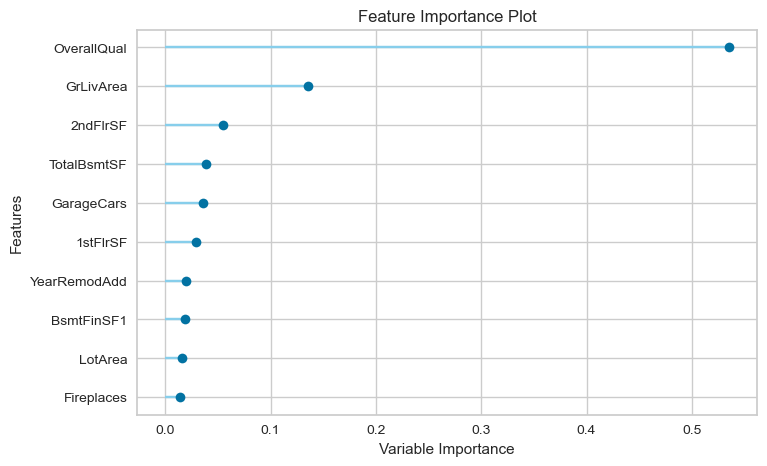

In [26]:
plot_model(best_model, plot="feature")

In [27]:
#Some of features are low correlated but high importance or vice versa
abs(df.corr(numeric_only=True)["SalePrice"]).sort_values(ascending=False)

SalePrice       1.000
OverallQual     0.791
GrLivArea       0.709
GarageCars      0.640
GarageArea      0.623
TotalBsmtSF     0.614
1stFlrSF        0.606
FullBath        0.561
TotRmsAbvGrd    0.534
YearBuilt       0.523
YearRemodAdd    0.507
GarageYrBlt     0.486
MasVnrArea      0.477
Fireplaces      0.467
BsmtFinSF1      0.386
LotFrontage     0.352
WoodDeckSF      0.324
2ndFlrSF        0.319
OpenPorchSF     0.316
HalfBath        0.284
LotArea         0.264
BsmtFullBath    0.227
BsmtUnfSF       0.214
BedroomAbvGr    0.168
KitchenAbvGr    0.136
EnclosedPorch   0.129
ScreenPorch     0.111
PoolArea        0.092
MSSubClass      0.084
OverallCond     0.078
MoSold          0.046
3SsnPorch       0.045
YrSold          0.029
LowQualFinSF    0.026
Id              0.022
MiscVal         0.021
BsmtHalfBath    0.017
BsmtFinSF2      0.011
Name: SalePrice, dtype: float64

In [34]:
final_model = finalize_model(best_model)
pred = predict_model(final_model,data=df2)

In [36]:
pred

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,prediction_label
0,1461,20,RH,80.000,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.000,TA,TA,CBlock,TA,TA,No,Rec,468.000,LwQ,144.000,270.000,882.000,GasA,TA,Y,SBrkr,896,0,0,896,0.000,0.000,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.000,Unf,1.000,730.000,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,121113.166
1,1462,20,RL,81.000,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.000,TA,TA,CBlock,TA,TA,No,ALQ,923.000,Unf,0.000,406.000,1329.000,GasA,TA,Y,SBrkr,1329,0,0,1329,0.000,0.000,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.000,Unf,1.000,312.000,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,164679.387
2,1463,60,RL,74.000,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.000,TA,TA,PConc,Gd,TA,No,GLQ,791.000,Unf,0.000,137.000,928.000,GasA,Gd,Y,SBrkr,928,701,0,1629,0.000,0.000,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.000,Fin,2.000,482.000,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,177012.879
3,1464,60,RL,78.000,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.000,TA,TA,PConc,TA,TA,No,GLQ,602.000,Unf,0.000,324.000,926.000,GasA,Ex,Y,SBrkr,926,678,0,1604,0.000,0.000,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.000,Fin,2.000,470.000,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal,182521.631
4,1465,120,RL,43.000,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.000,Gd,TA,PConc,Gd,TA,No,ALQ,263.000,Unf,0.000,1017.000,1280.000,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.000,0.000,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.000,RFn,2.000,506.000,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal,198647.726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,RM,21.000,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,2Story,4,7,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.000,TA,TA,CBlock,TA,TA,No,Unf,0.000,Unf,0.000,546.000,546.000,GasA,Gd,Y,SBrkr,546,546,0,1092,0.000,0.000,1,1,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal,74299.628
1455,2916,160,RM,21.000,1894,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,4,5,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.000,TA,TA,CBlock,TA,TA,No,Rec,252.000,Unf,0.000,294.000,546.000,GasA,TA,Y,SBrkr,546,546,0,1092,0.000,0.000,1,1,3,1,TA,6,Typ,0,NaN,CarPort,1970.000,Unf,1.000,286.000,TA,TA,Y,0,24,0,0,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml,85018.812
1456,2917,20,RL,160.000,20000,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,7,1960,1996,Gable,CompShg,VinylSd,VinylSd,NaN,0.000,TA,TA,CBlock,TA,TA,No,ALQ,1224.000,Unf,0.000,0.000,1224.000,GasA

In [37]:
predictions = pd.DataFrame()
predictions["Id"] = df2["Id"]
predictions["SalePrice"] = pred["prediction_label"]
predictions

,Id,SalePrice
0,1461,121113.166
1,1462,164679.387
2,1463,177012.879
3,1464,182521.631
4,1465,198647.726
...,...,...
1454,2915,74299.628
1455,2916,85018.812
1456,2917,156887.334
1457,2918,118078.984


In [40]:
predictions.to_csv("price_prediction.csv", index=False)


In [208]:
# took the correlated between 20% and 80% and objects
df = df[['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF', '1stFlrSF', 
'FullBath', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'MasVnrArea', 
'Fireplaces', 'BsmtFinSF1', 'LotFrontage', 'WoodDeckSF', '2ndFlrSF', 'OpenPorchSF', 'HalfBath', 
'LotArea', 'BsmtFullBath', 'BsmtUnfSF','MSZoning','Street','Alley','LotShape','LandContour',
'Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType',
'HouseStyle','RoofMatl','Exterior1st','Exterior2nd','MasVnrType','ExterQual','ExterCond',
'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',
'Heating','HeatingQC','CentralAir','Electrical','KitchenQual','Functional','FireplaceQu','GarageType',
'GarageFinish','GarageQual','GarageCond','PavedDrive','PoolQC','Fence','MiscFeature','SaleType','SaleCondition','SalePrice']]

df.head()

,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,YearRemodAdd,GarageYrBlt,MasVnrArea,Fireplaces,BsmtFinSF1,LotFrontage,WoodDeckSF,2ndFlrSF,OpenPorchSF,HalfBath,LotArea,BsmtFullBath,BsmtUnfSF,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
0,7,1710,2.000,548.000,856.000,856,2,8,2003,2003,2003.000,196.000,0,706.000,65.000,0,854,61,1,8450,1.000,150.000,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal,208500.000
1,6,1262,2.000,460.000,1262.000,1262,2,6,1976,1976,1976.000,0.000,1,978.000,80.000,298,0,0,0,9600,0.000,284.000,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,CompShg,MetalSd,MetalSd,NaN,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal,181500.000
2,7,1786,2.000,608.000,920.000,920,2,6,2001,2002,2001.000,162.000,1,486.000,68.000,0,866,42,1,11250,1.000,434.000,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal,223500.000
3,7,1717,3.000,642.000,756.000,961,1,7,1915,1970,1998.000,0.000,1,216.000,60.000,0,756,35,0,9550,1.000,540.000,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,CompShg,Wd Sdng,Wd Shng,NaN,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml,140000.000
4,8,2198,3.000,836.000,1145.000,1145,2,9,2000,2000,2000.000,350.000,1,655.000,84.000,192,1053,84,1,14260,1.000,490.000,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal,250000.000


In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Data columns (total 65 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   OverallQual    2919 non-null   int64  
 1   GrLivArea      2919 non-null   int64  
 2   GarageCars     2918 non-null   float64
 3   GarageArea     2918 non-null   float64
 4   TotalBsmtSF    2918 non-null   float64
 5   1stFlrSF       2919 non-null   int64  
 6   FullBath       2919 non-null   int64  
 7   TotRmsAbvGrd   2919 non-null   int64  
 8   YearBuilt      2919 non-null   int64  
 9   YearRemodAdd   2919 non-null   int64  
 10  GarageYrBlt    2760 non-null   float64
 11  MasVnrArea     2896 non-null   float64
 12  Fireplaces     2919 non-null   int64  
 13  BsmtFinSF1     2918 non-null   float64
 14  LotFrontage    2433 non-null   float64
 15  WoodDeckSF     2919 non-null   int64  
 16  2ndFlrSF       2919 non-null   int64  
 17  OpenPorchSF    2919 non-null   int64  
 18  HalfBath

In [62]:
df.shape

(2919, 65)

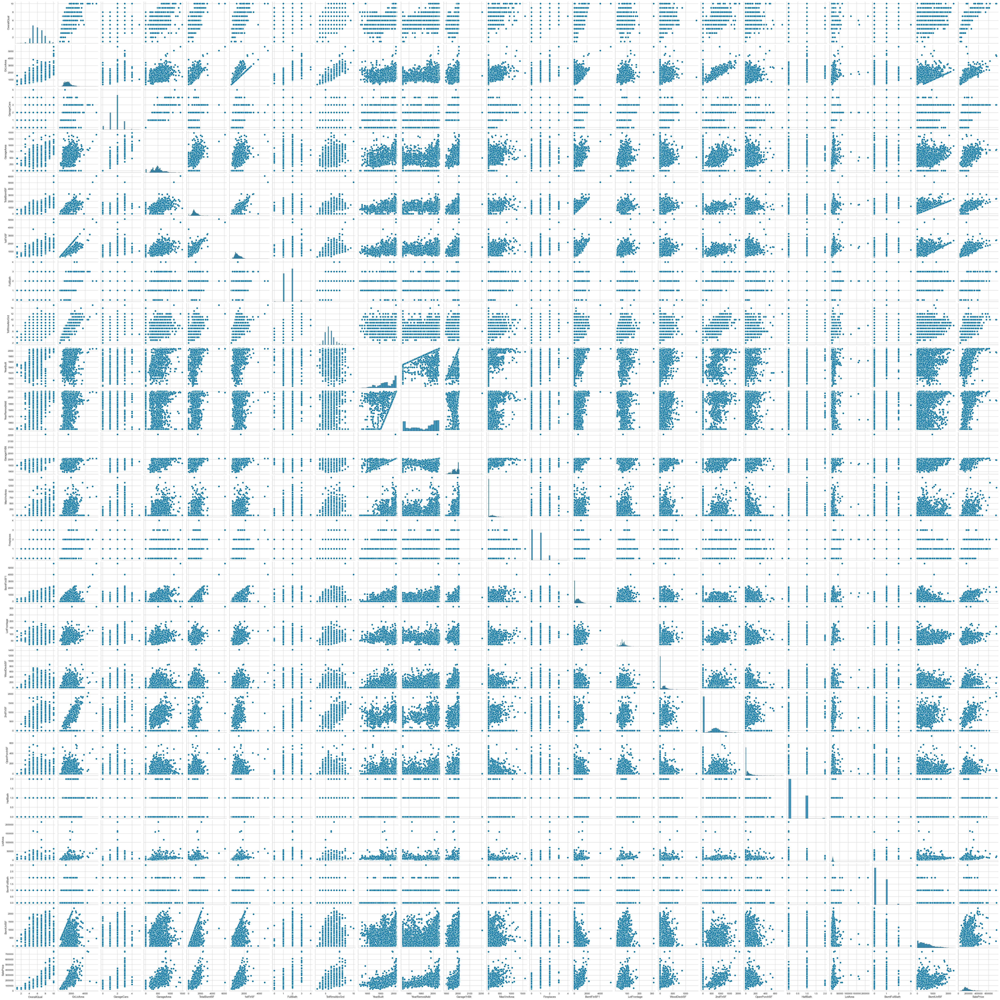

In [52]:
sns.pairplot(df);

## Handing missing values and Feature Engineering

In [63]:
df.isnull().sum()

OverallQual         0
GrLivArea           0
GarageCars          1
GarageArea          1
TotalBsmtSF         1
1stFlrSF            0
FullBath            0
TotRmsAbvGrd        0
YearBuilt           0
YearRemodAdd        0
GarageYrBlt       159
MasVnrArea         23
Fireplaces          0
BsmtFinSF1          1
LotFrontage       486
WoodDeckSF          0
2ndFlrSF            0
OpenPorchSF         0
HalfBath            0
LotArea             0
BsmtFullBath        2
BsmtUnfSF           1
MSZoning            4
Street              0
Alley            2721
LotShape            0
LandContour         0
Utilities           2
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
RoofMatl            0
Exterior1st         1
Exterior2nd         1
MasVnrType       1766
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           81
BsmtCond           82
BsmtExposure       82
BsmtFinTyp

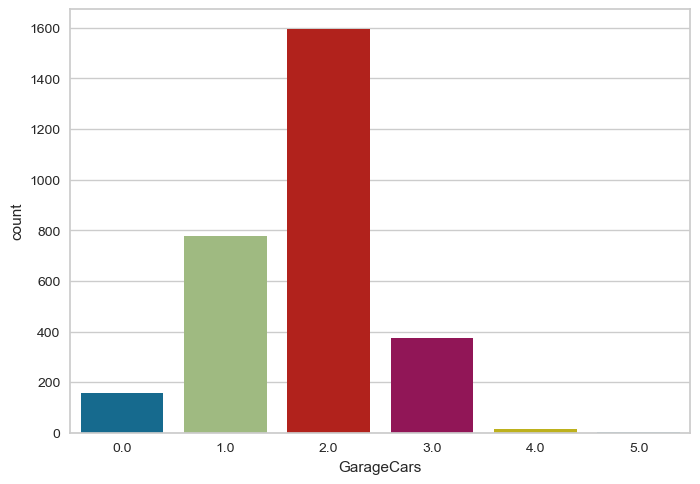

In [128]:
sns.countplot(x=df["GarageCars"]);

In [209]:
df["GarageCars"].fillna(2.0, inplace=True)

In [210]:
df["GarageArea"].describe()

count   2918.000
mean     472.875
std      215.395
min        0.000
25%      320.000
50%      480.000
75%      576.000
max     1488.000
Name: GarageArea, dtype: float64

In [211]:
df["GarageArea"].fillna(df["GarageArea"].median, inplace=True)

In [212]:
df["TotalBsmtSF"].describe()

count   2918.000
mean    1051.778
std      440.766
min        0.000
25%      793.000
50%      989.500
75%     1302.000
max     6110.000
Name: TotalBsmtSF, dtype: float64

In [213]:
df["TotalBsmtSF"].fillna(df["TotalBsmtSF"].median(), inplace=True)

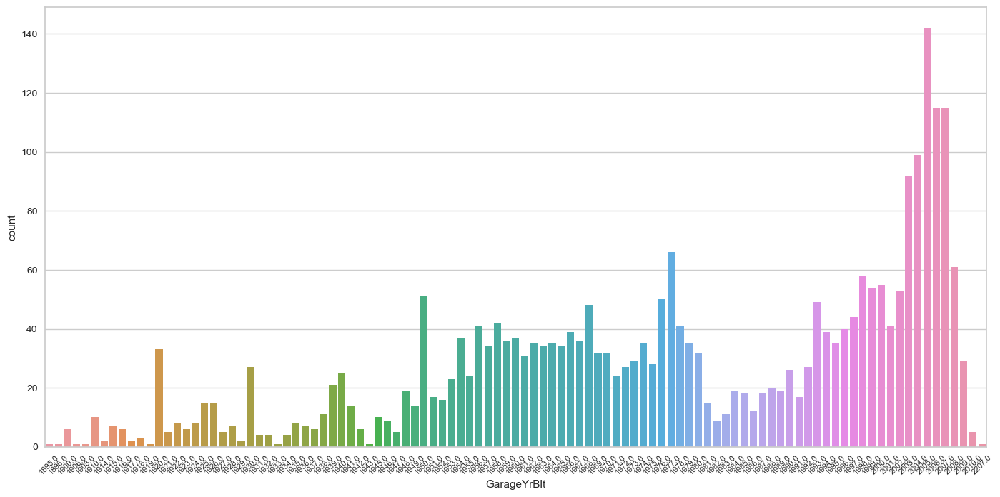

In [214]:
plt.figure(figsize=(17,8))
plt.xticks(rotation=45, size=8)
sns.countplot(x=df["GarageYrBlt"]);

In [215]:
df["GarageYrBlt"].describe()

count   2760.000
mean    1978.113
std       25.574
min     1895.000
25%     1960.000
50%     1979.000
75%     2002.000
max     2207.000
Name: GarageYrBlt, dtype: float64

In [216]:
df["GarageYrBlt"] = df["GarageYrBlt"].replace(2207.0, 2007)

In [217]:
abs(df.corr(numeric_only=True)["GarageYrBlt"]).sort_values(ascending=False)


GarageYrBlt    1.000
YearBuilt      0.844
YearRemodAdd   0.659
GarageCars     0.596
OverallQual    0.576
FullBath       0.501
SalePrice      0.486
TotalBsmtSF    0.350
GrLivArea      0.277
1stFlrSF       0.261
MasVnrArea     0.255
OpenPorchSF    0.237
HalfBath       0.231
WoodDeckSF     0.225
BsmtFinSF1     0.196
BsmtUnfSF      0.171
TotRmsAbvGrd   0.166
BsmtFullBath   0.155
2ndFlrSF       0.090
Fireplaces     0.089
LotFrontage    0.078
LotArea        0.008
Name: GarageYrBlt, dtype: float64

In [218]:
df["GarageYrBlt"] = df["GarageYrBlt"].fillna(df.groupby("YearBuilt")["GarageYrBlt"].transform("median"))

In [219]:
df["GarageYrBlt"].fillna(df["YearBuilt"], inplace=True)

In [220]:
df["GarageYrBlt"] = df["GarageYrBlt"].astype(int)

In [221]:
df.to_pickle("df.pkl")


In [222]:
df = pd.read_pickle("df.pkl")

In [223]:
df.MasVnrArea.describe()

count   2896.000
mean     102.201
std      179.334
min        0.000
25%        0.000
50%        0.000
75%      164.000
max     1600.000
Name: MasVnrArea, dtype: float64

In [224]:
df.MasVnrArea.fillna(0,inplace=True)

In [225]:
df.BsmtFinSF1.describe()

count   2918.000
mean     441.423
std      455.611
min        0.000
25%        0.000
50%      368.500
75%      733.000
max     5644.000
Name: BsmtFinSF1, dtype: float64

In [226]:
df.BsmtFinSF1.fillna(df.BsmtFinSF1.median(), inplace=True)

In [227]:
df.LotFrontage.describe()

count   2433.000
mean      69.306
std       23.345
min       21.000
25%       59.000
50%       68.000
75%       80.000
max      313.000
Name: LotFrontage, dtype: float64

In [228]:
lr = LinearRegression()
imputation = IterativeImputer(estimator=lr)
df["LotFrontage"] = imputation.fit_transform(df[["LotFrontage"]])

In [229]:
df["LotFrontage"] = df["LotFrontage"].ravel()

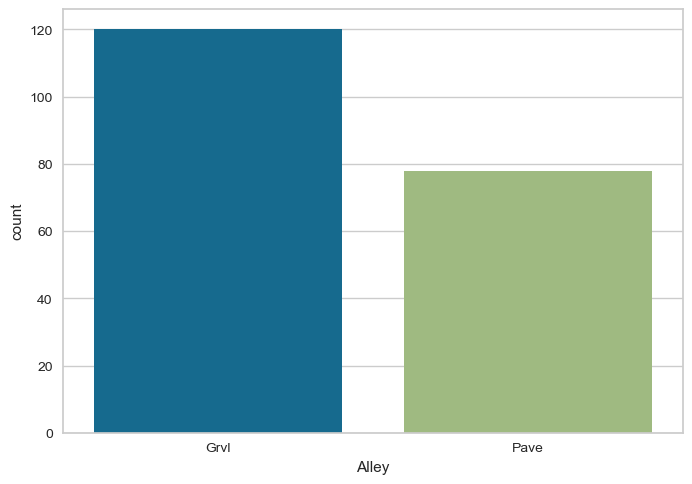

In [230]:
sns.countplot(x=df["Alley"]);

In [231]:

df["Fence"].fillna(0,inplace=True)
df["MiscFeature"].fillna("Othr",inplace=True)
df["MasVnrType"].fillna(0,inplace=True)
df["Alley"].fillna(0,inplace=True)

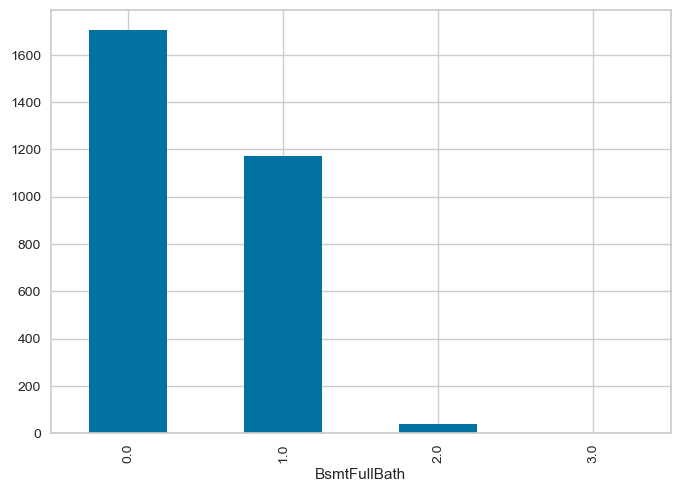

In [232]:
df.BsmtFullBath.value_counts().plot.bar();

In [233]:
df.BsmtFullBath.fillna(0,inplace=True)

In [234]:
df["BsmtUnfSF"].fillna(df["BsmtUnfSF"].median(),inplace=True)

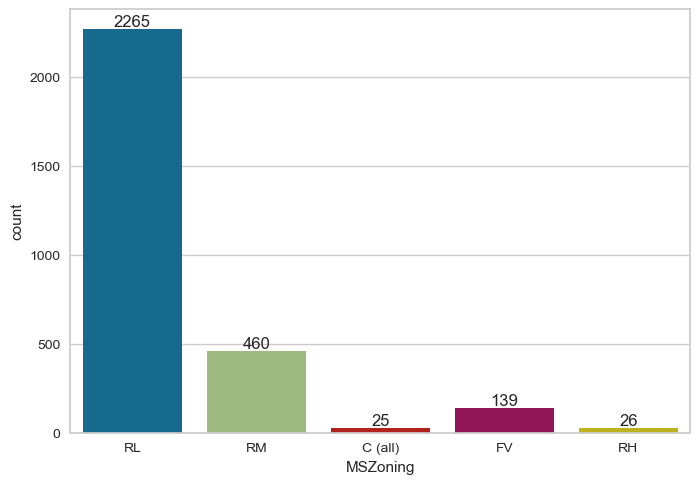

In [235]:
ax = sns.countplot(x=df["MSZoning"])
ax.bar_label(ax.containers[0]);

In [236]:
df["MSZoning"] = df["MSZoning"].fillna("RL")

In [237]:
df["MSZoning"].value_counts()

MSZoning
RL         2269
RM          460
FV          139
RH           26
C (all)      25
Name: count, dtype: int64

In [238]:
df["Utilities"].value_counts()

Utilities
AllPub    2916
NoSeWa       1
Name: count, dtype: int64

In [239]:
df["Utilities"].fillna(df["Utilities"].mode()[0], inplace=True)

In [240]:
df["Exterior1st"].fillna(df["Exterior1st"].mode()[0], inplace=True)
df["Exterior2nd"].fillna(df["Exterior2nd"].mode()[0], inplace=True)
df["Electrical"].fillna(df["Electrical"].mode()[0], inplace=True)
df["KitchenQual"].fillna(df["KitchenQual"].mode()[0], inplace=True)
df["Functional"].fillna(df["Functional"].mode()[0], inplace=True)
df["SaleType"].fillna("Oth",inplace=True)

In [241]:
# Correct the dictionary key for case sensitivity and potential NA values
d = {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0, "na":0}

df["BsmtQual"] = df["BsmtQual"].map(d)
df["BsmtQual"] = df["BsmtQual"].fillna(0)
df["BsmtQual"] = df["BsmtQual"].astype(int)

df["HeatingQC"] = df["HeatingQC"].map(d)
df["HeatingQC"] = df["HeatingQC"].fillna(0)
df["HeatingQC"] = df["HeatingQC"].astype(int)

df["KitchenQual"] = df["KitchenQual"].map(d)
df["KitchenQual"] = df["KitchenQual"].fillna(0)
df["KitchenQual"] = df["KitchenQual"].astype(int)

df["FireplaceQu"] = df["FireplaceQu"].map(d)
df["FireplaceQu"] = df["FireplaceQu"].fillna(0)
df["FireplaceQu"] = df["FireplaceQu"].astype(int)

df["GarageQual"] = df["GarageQual"].map(d)
df["GarageQual"] = df["GarageQual"].fillna(0)
df["GarageQual"] = df["GarageQual"].astype(int)

df["PoolQC"] = df["PoolQC"].map(d)
df["PoolQC"] = df["PoolQC"].fillna(0)
df["PoolQC"] = df["PoolQC"].astype(int)

df["ExterQual"] = df["ExterQual"].map(d)
df["ExterQual"] = df["ExterQual"].fillna(0)
df["ExterQual"] = df["ExterQual"].astype(int)

df["BsmtCond"] = df["BsmtCond"].map(d)
df["BsmtCond"] = df["BsmtCond"].fillna(0)
df["BsmtCond"] = df["BsmtCond"].astype(int)



In [242]:
df.to_pickle("df2.pkl")

In [459]:
df = pd.read_pickle("df2.pkl")

In [460]:
df["GarageCond"] = df["GarageCond"].map(d)
df["GarageCond"] = df["GarageCond"].fillna(0)
df["GarageCond"] = df["GarageCond"].astype(int)

In [461]:
d = {"Gd":3, "Av":2, "Mn":1, "No":0, "NA":0}
df["BsmtExposure"] = df["BsmtExposure"].map(d)
df["BsmtExposure"] = df["BsmtExposure"].fillna(0)
df["BsmtExposure"] = df["BsmtExposure"].astype(int)

In [462]:
d = {"GLQ":6, "ALQ":5, "BLQ":4, "Rec":3, "LwQ":2,"Unf":1, "NA":0}
df["BsmtFinType1"] = df["BsmtFinType1"].map(d)
df["BsmtFinType1"] = df["BsmtFinType1"].fillna(0)
df["BsmtFinType1"] = df["BsmtFinType1"].astype(int)

df["BsmtFinType2"] = df["BsmtFinType2"].map(d)
df["BsmtFinType2"] = df["BsmtFinType2"].fillna(0)
df["BsmtFinType2"] = df["BsmtFinType2"].astype(int)




In [463]:
d = {"Fin":3, "RFn":2, "Unf":1, "NA":0}
df["GarageFinish"] = df["GarageFinish"].map(d)
df["GarageFinish"] = df["GarageFinish"].fillna(0)
df["GarageFinish"] = df["GarageFinish"].astype(int)


In [464]:
df["GarageType"].fillna("0",inplace=True)

In [465]:
d = {"GdPrv":4, "MnPrv":3, "GdWo":2, "MnWw":1,"NA":0}
df["Fence"] = df["Fence"].map(d)
df["Fence"] = df["Fence"].fillna(0)
df["Fence"] = df["Fence"].astype(int)

In [466]:
df.isnull().sum()

OverallQual         0
GrLivArea           0
GarageCars          0
GarageArea          0
TotalBsmtSF         0
1stFlrSF            0
FullBath            0
TotRmsAbvGrd        0
YearBuilt           0
YearRemodAdd        0
GarageYrBlt         0
MasVnrArea          0
Fireplaces          0
BsmtFinSF1          0
LotFrontage         0
WoodDeckSF          0
2ndFlrSF            0
OpenPorchSF         0
HalfBath            0
LotArea             0
BsmtFullBath        0
BsmtUnfSF           0
MSZoning            0
Street              0
Alley               0
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          0
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual            0
BsmtCond            0
BsmtExposure        0
BsmtFinTyp

In [467]:
import datetime
df["age"] = datetime.datetime.now().year - df["YearBuilt"]

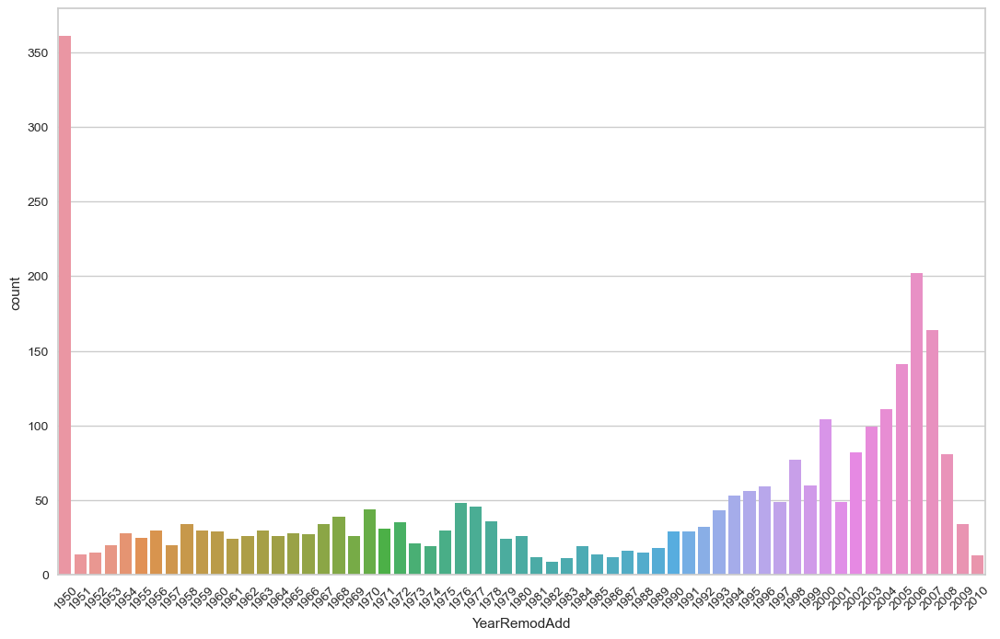

In [468]:
plt.figure(figsize=(13,8))
plt.xticks(rotation=45)
sns.countplot(x=df["YearRemodAdd"]);


In [469]:
df["ageRemod"] = datetime.datetime.now().year - df["YearRemodAdd"]


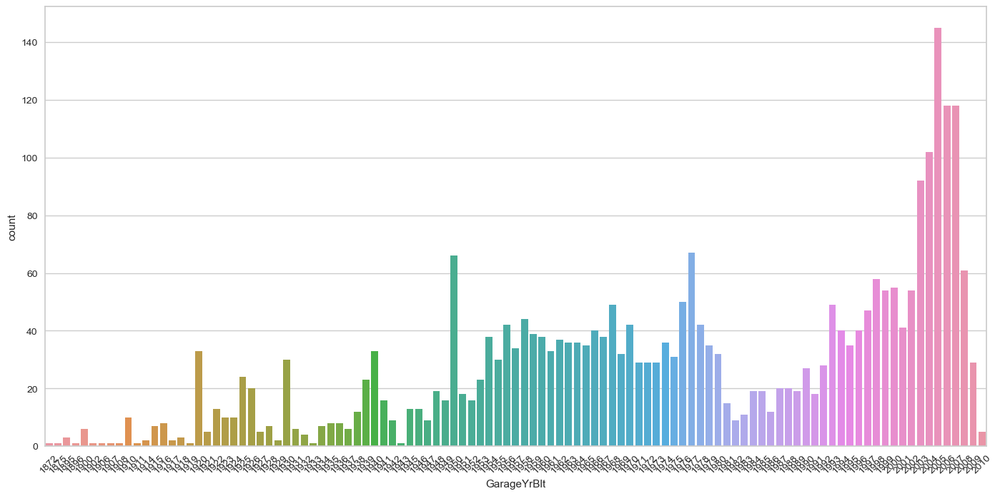

In [470]:
plt.figure(figsize=(17,8))
plt.xticks(rotation=45)
sns.countplot(x=df["GarageYrBlt"]);

In [471]:
df["ageGarage"] = datetime.datetime.now().year - df["GarageYrBlt"]



In [625]:
df.to_pickle("ndf.pkl")
df = pd.read_pickle("ndf.pkl")

In [626]:
df["OverallQual"] = df["OverallQual"]*3
#df["GrLivArea"] = df["GrLivArea"]*2
#df["2ndFlrSF"] = df["2ndFlrSF"]*2
# increase importances

In [627]:
df.to_pickle("df3.pkl")

In [89]:
df = pd.read_pickle("df3.pkl")
df.head()

,OverallQual,GrLivArea,GarageCars,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,YearRemodAdd,GarageYrBlt,MasVnrArea,Fireplaces,BsmtFinSF1,LotFrontage,WoodDeckSF,2ndFlrSF,OpenPorchSF,HalfBath,LotArea,BsmtFullBath,BsmtUnfSF,ExterQual,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,HeatingQC,KitchenQual,FireplaceQu,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,SalePrice,age,ageRemod,ageGarage,GarageArea_460.0,GarageArea_608.0,GarageArea_642.0,GarageArea_836.0,GarageArea_480.0,GarageArea_636.0,GarageArea_484.0,GarageArea_468.0,GarageArea_205.0,GarageArea_384.0,GarageArea_736.0,GarageArea_352.0,GarageArea_840.0,GarageArea_576.0,GarageArea_516.0,GarageArea_294.0,GarageArea_853.0,GarageArea_280.0,GarageArea_534.0,GarageArea_572.0,GarageArea_270.0,GarageArea_890.0,GarageArea_772.0,GarageArea_319.0,GarageArea_240.0,GarageArea_250.0,GarageArea_271.0,GarageArea_447.0,GarageArea_556.0,GarageArea_691.0,GarageArea_672.0,GarageArea_498.0,GarageArea_246.0,GarageArea_0.0,GarageArea_440.0,GarageArea_308.0,GarageArea_504.0,GarageArea_300.0,GarageArea_670.0,GarageArea_826.0,GarageArea_386.0,GarageArea_388.0,GarageArea_528.0,GarageArea_894.0,GarageArea_565.0,GarageArea_641.0,GarageArea_288.0,GarageArea_645.0,GarageArea_852.0,GarageArea_558.0,GarageArea_220.0,GarageArea_667.0,GarageArea_360.0,GarageArea_427.0,GarageArea_490.0,GarageArea_379.0,GarageArea_297.0,GarageArea_283.0,GarageArea_509.0,GarageArea_405.0,GarageArea_758.0,GarageArea_461.0,GarageArea_400.0,GarageArea_462.0,GarageArea_420.0,GarageArea_432.0,GarageArea_506.0,GarageArea_684.0,GarageArea_472.0,GarageArea_366.0,GarageArea_476.0,GarageArea_410.0,GarageArea_740.0,GarageArea_648.0,GarageArea_273.0,GarageArea_546.0,GarageArea_325.0,GarageArea_792.0,GarageArea_450.0,GarageArea_180.0,GarageArea_430.0,GarageArea_594.0,GarageArea_390.0,GarageArea_540.0,GarageArea_264.0,GarageArea_530.0,GarageArea_435.0,GarageArea_453.0,GarageArea_750.0,GarageArea_487.0,GarageArea_624.0,GarageArea_471.0,GarageArea_318.0,GarageArea_766.0,GarageArea_660.0,GarageArea_470.0,GarageArea_720.0,GarageArea_577.0,GarageArea_380.0,GarageArea_434.0,GarageArea_866.0,GarageArea_495.0,GarageArea_564.0,GarageArea_312.0,GarageArea_625.0,GarageArea_680.0,GarageArea_678.0,GarageArea_726.0,GarageArea_532.0,GarageArea_216.0,GarageArea_303.0,GarageArea_789.0,GarageArea_511.0,GarageArea_616.0,GarageArea_521.0,GarageArea_451.0,GarageArea_1166.0,GarageArea_252.0,GarageArea_497.0,GarageArea_682.0,GarageArea_666.0,GarageArea_786.0,GarageArea_795.0,GarageArea_856.0,GarageArea_473.0,GarageArea_398.0,GarageArea_500.0,GarageArea_349.0,GarageArea_454.0,GarageArea_644.0,GarageArea_299.0,GarageArea_210.0,GarageArea_431.0,GarageArea_438.0,GarageArea_675.0,GarageArea_968.0,GarageArea_721.0,GarageArea_336.0,GarageArea_810.0,GarageArea_494.0,GarageArea_457.0,GarageArea_818.0,GarageArea_463.0,GarageArea_604.0,GarageArea_389.0,GarageArea_538.0,GarageArea_520.0,GarageArea_309.0,GarageArea_429.0,GarageArea_673.0,GarageArea_884.0,GarageArea_868.0,GarageArea_492.0,GarageArea_413.0,GarageArea_924.0,GarageArea_1053.0,GarageArea_439.0,GarageArea_671.0,GarageArea_338.0,GarageArea_573.0,GarageArea_732.0,GarageArea_505.0,GarageArea_575.0,GarageArea_626.0,GarageArea_898.0,GarageArea_529.0,GarageArea_685.0,GarageArea_281.0,GarageArea_539.0,GarageArea_418.0,GarageArea_588.0,GarageArea_282.0,GarageArea_375.0,GarageArea_683.0,GarageArea_843.0,GarageArea_552.0,GarageArea_870.0,GarageArea_888.0,GarageArea_746.0,GarageArea_708.0,GarageArea_513.0,GarageArea_1025.0,GarageArea_656.0,GarageArea_872.0,GarageArea_292.0,GarageArea_441.0,GarageArea_189.0,GarageArea_880.0,GarageArea_676.0,GarageArea_301.0,GarageArea_474.0,GarageArea_706.0,GarageArea_617.0,GarageArea_445.0,GarageArea_200.0,GarageArea_592.0,GarageArea_566.0,GarageArea_514.0,GarageArea_296.0,GarageArea_244.0,GarageArea_610.0,GarageArea_834.0,GarageArea_639.0,GarageArea_501.0,GarageArea_846.0,GarageArea_560.0,GarageArea_596.0,GarageArea_600.0,GarageArea_373.0,GarageArea_947.0,GarageArea_350.0,G

## Outlier Analysis

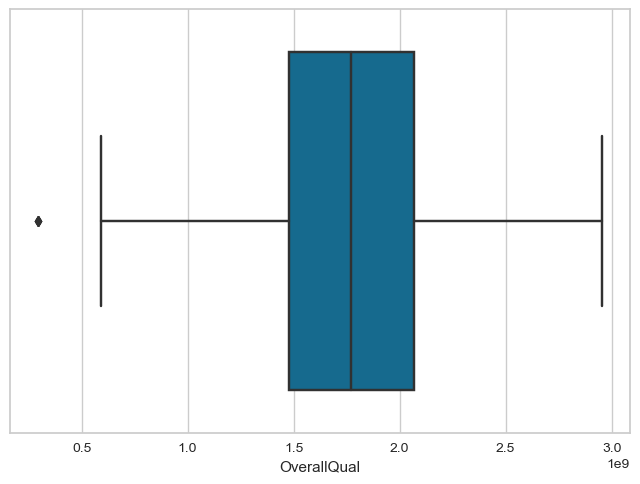

In [639]:
sns.boxplot(x=df["OverallQual"]);

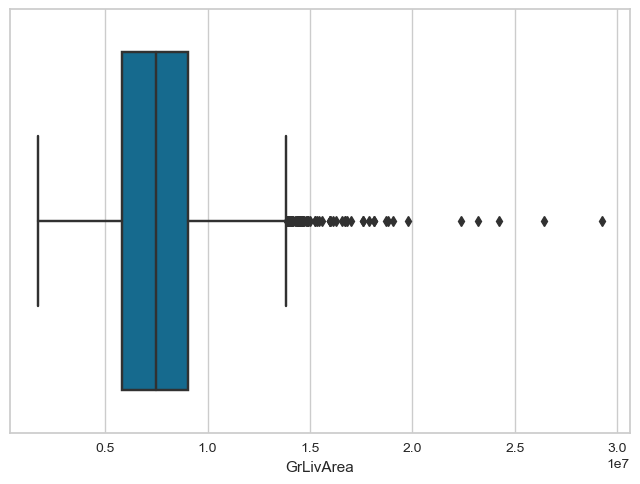

In [640]:
sns.boxplot(x=df["GrLivArea"]);

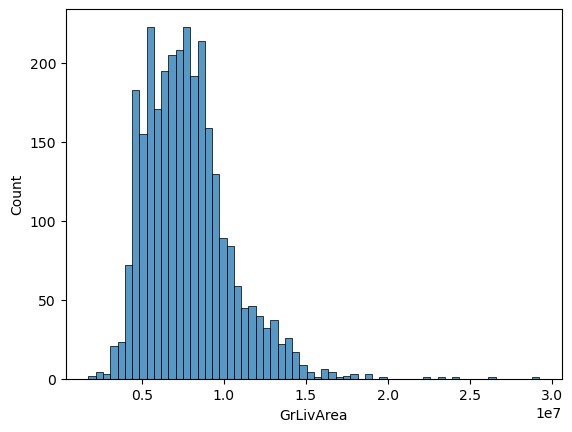

In [3]:
sns.histplot(x=df["GrLivArea"]);

In [37]:
#df = df[df["GrLivArea"] < df["GrLivArea"].quantile(q=0.97)]

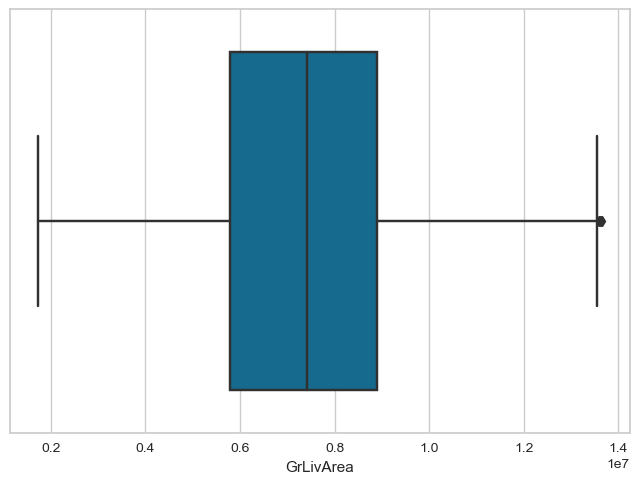

In [4]:
sns.boxplot(x=df["GrLivArea"]);

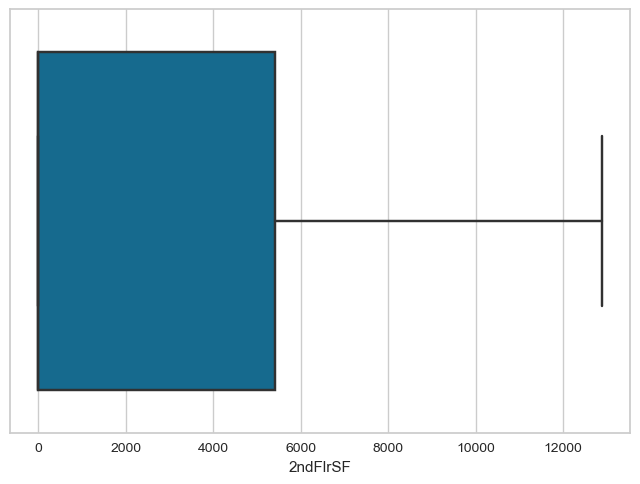

In [5]:
sns.boxplot(x=df["2ndFlrSF"]);

In [38]:
#df = df[df["2ndFlrSF"] < df["2ndFlrSF"].quantile(q=0.97)]

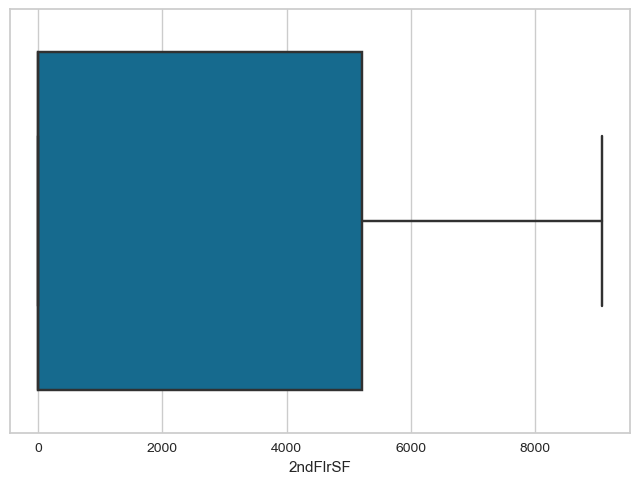

In [7]:
sns.boxplot(x=df["2ndFlrSF"]);

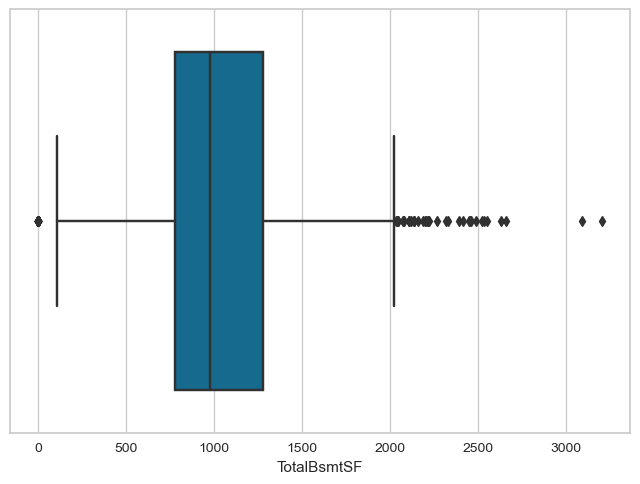

In [8]:
sns.boxplot(x=df["TotalBsmtSF"]);

In [39]:
#df = df[df["TotalBsmtSF"] < df["TotalBsmtSF"].quantile(q=0.97)]

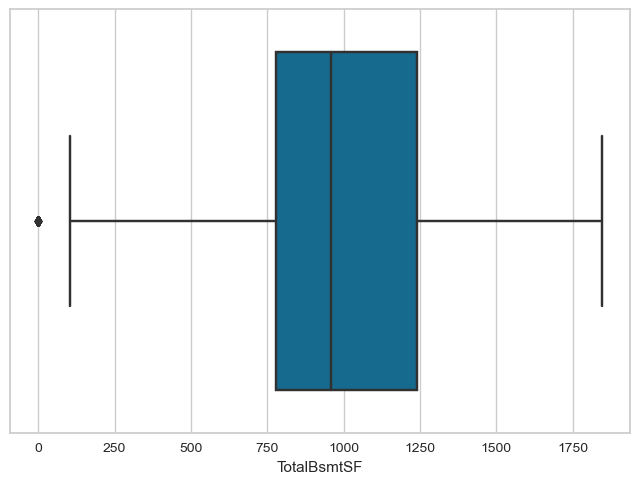

In [10]:
sns.boxplot(x=df["TotalBsmtSF"]);

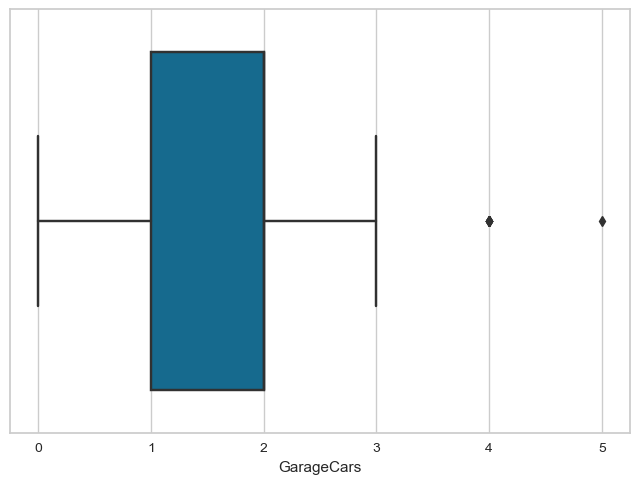

In [11]:
sns.boxplot(x=df["GarageCars"]);

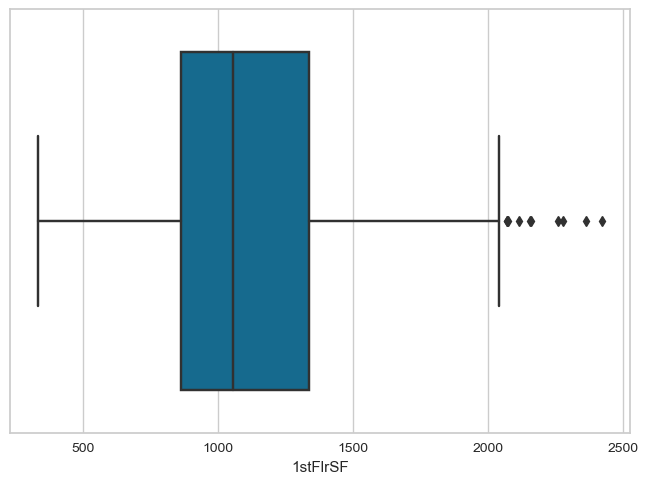

In [12]:
sns.boxplot(x=df["1stFlrSF"]);

In [40]:
#df = df[df["1stFlrSF"] < df["1stFlrSF"].quantile(q=0.97)]

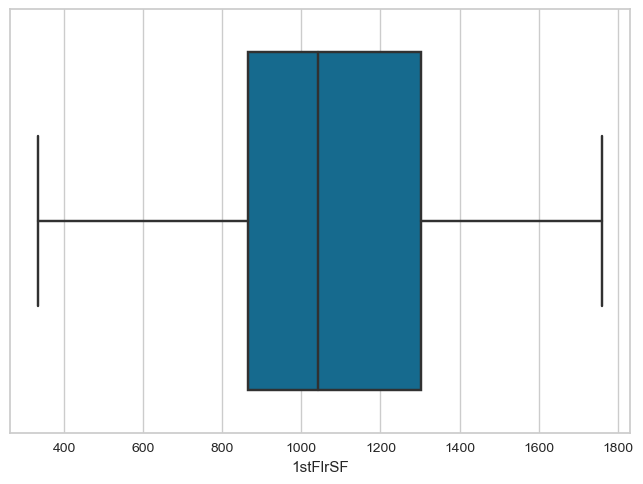

In [14]:
sns.boxplot(x=df["1stFlrSF"]);

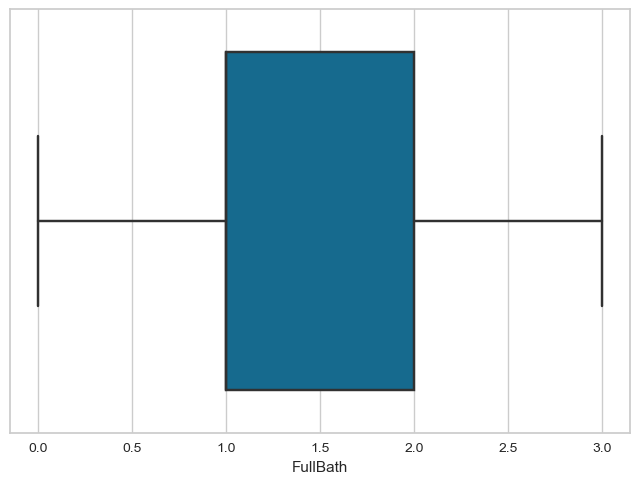

In [15]:
sns.boxplot(x=df["FullBath"]);

## Preprocessing

In [90]:
df = pd.get_dummies(df, drop_first=True)

In [91]:
train = df[:1460]
test = df[1460:]

In [92]:
test1 = test.drop("SalePrice", axis=1)

In [93]:
X = train.drop("SalePrice", axis=1)
y = train[["SalePrice"]]

In [94]:
scaler = StandardScaler()
X = scaler.fit_transform(X)


In [95]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Modelling

In [96]:
gbr = GradientBoostingRegressor()
model = gbr.fit(X_train, y_train)
prediction = model.predict(X_test)

In [97]:
print(f"RMSE...: {np.sqrt(mean_squared_error(prediction, y_test))}\nR2 SCORE...: {r2_score(prediction, y_test)}")

RMSE...: 27817.737777426024
R2 SCORE...: 0.8736299388988388


In [98]:
rf = RandomForestRegressor()
model_rf = rf.fit(X_train, y_train)
prediction_rf = model_rf.predict(X_test)

In [99]:
print(f"RMSE...: {np.sqrt(mean_squared_error(prediction_rf, y_test))}\nR2 SCORE...: {r2_score(prediction_rf, y_test)}")

RMSE...: 28760.9341500842
R2 SCORE...: 0.8511518441561488


## Feature Importance

In [647]:
feature_importances = model.feature_importances_

In [651]:
feature_names = ['OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 
                 'YearBuilt', 'YearRemodAdd', 'GarageYrBlt',"GarageArea",  
"TotalBsmtSF",    
"1stFlrSF",       
"FullBath",       
"TotRmsAbvGrd",    
"YearBuilt",       
"YearRemodAdd",    
"GarageYrBlt",    
"MasVnrArea",      
"Fireplaces",    
"BsmtFinSF1",   
"LotFrontage",    
"WoodDeckSF",      
"2ndFlrSF",    
"OpenPorchSF",     
"LotArea",        
"BsmtFullBath",   
"BsmtUnfSF"]
importances = dict(zip(feature_names, feature_importances))
importances

{'OverallQual': 0.5001572995728728,
 'GrLivArea': 0.15515711474578595,
 'GarageCars': 0.03937618485051012,
 'TotalBsmtSF': 0.0012606445618172563,
 '1stFlrSF': 0.03227176412322145,
 'FullBath': 0.0017099095850475322,
 'TotRmsAbvGrd': 0.001313280603568253,
 'YearBuilt': 0.029872365162994154,
 'YearRemodAdd': 0.005150234142250466,
 'GarageYrBlt': 0.00016501682372254645,
 'GarageArea': 3.9837621186381574e-05,
 'MasVnrArea': 0.01825269134149845,
 'Fireplaces': 0.00037483121451969644,
 'BsmtFinSF1': 0.0005119680083522891,
 'LotFrontage': 0.01241538107887797,
 'WoodDeckSF': 0.02196711903045501,
 '2ndFlrSF': 0.0015289772145680967,
 'OpenPorchSF': 0.0029125602686707387,
 'LotArea': 0.0027824153898449912,
 'BsmtFullBath': 0.0014352516010557206,
 'BsmtUnfSF': 0.0}

In [652]:
for feature, importance in sorted(importances.items(), key=lambda x: x[1], reverse=True):
    print(f"{feature}: {importance}")

OverallQual: 0.5001572995728728
GrLivArea: 0.15515711474578595
GarageCars: 0.03937618485051012
1stFlrSF: 0.03227176412322145
YearBuilt: 0.029872365162994154
WoodDeckSF: 0.02196711903045501
MasVnrArea: 0.01825269134149845
LotFrontage: 0.01241538107887797
YearRemodAdd: 0.005150234142250466
OpenPorchSF: 0.0029125602686707387
LotArea: 0.0027824153898449912
FullBath: 0.0017099095850475322
2ndFlrSF: 0.0015289772145680967
BsmtFullBath: 0.0014352516010557206
TotRmsAbvGrd: 0.001313280603568253
TotalBsmtSF: 0.0012606445618172563
BsmtFinSF1: 0.0005119680083522891
Fireplaces: 0.00037483121451969644
GarageYrBlt: 0.00016501682372254645
GarageArea: 3.9837621186381574e-05
BsmtUnfSF: 0.0


In [653]:
prediction_df = pd.DataFrame(prediction, index=y_test.index, columns=y_test.columns)
residuals = prediction_df - y_test
residuals

,SalePrice
892,-11599.255
1105,24339.038
413,9864.256
522,-19601.851
1036,10449.671
...,...
479,26278.843
1361,-22122.121
802,-3881.824
651,12925.140


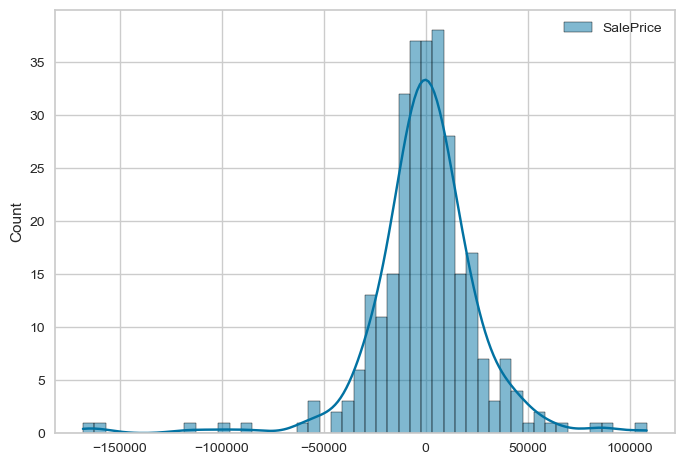

In [654]:
sns.histplot(residuals, kde=True, bins=50);

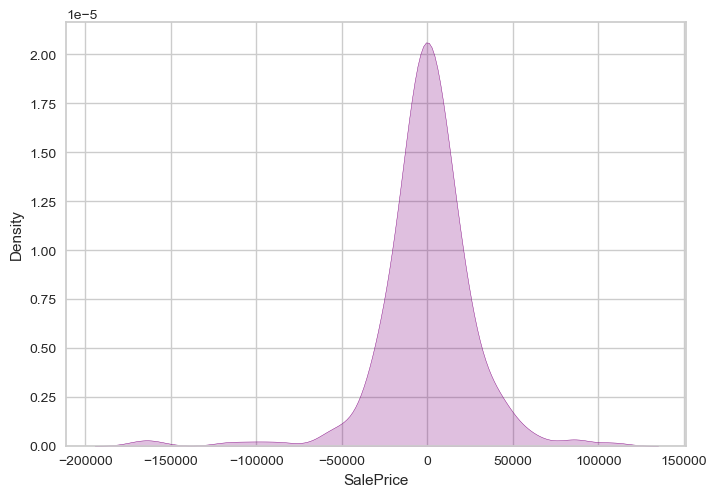

In [656]:
sns.kdeplot(residuals, x="SalePrice", color="purple", fill=True);

In [662]:
# normal distribution test
from scipy.stats import shapiro
shapiro(residuals)

ShapiroResult(statistic=0.8543275594711304, pvalue=6.385761272317673e-16)

In [663]:
def shapiroTest(ts):
    val = shapiro(ts)
    statistic = round(val[0],3)
    pval = round(val[1], 3)
    criticalVal = 0.05
    if pval < criticalVal:
        print("H0 is rejected.")
    else:
        print("H0 is not rejected")

In [665]:
shapiroTest(residuals)

H0 is rejected.
